## Importing The Libraries

In [1]:
import torch #for model
import numpy as np #for math
import cv2 #for img processing
import json #for data collection
from torch.utils.data import Dataset #for model
import matplotlib.pyplot as plt #for visualization
import matplotlib.image as mpimg #for visualization
import torch.nn as nn #for model
import os #for data collection
from torchvision import models #for data collection
import math #for math
import random #for math
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torch.nn.functional import relu
from torch.nn.functional import softmax
import torch.nn.functional as F
import time

In [2]:
torch.cuda.empty_cache()
# Check if CUDA is available, as GPU usage speeds up model training by a lot
if torch.cuda.is_available():
    print("CUDA is available!")
else:
    print("CUDA is not available.")
GPU = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

CUDA is available!


## Getting the Data

In [3]:
def loadImages(directory): #loads the collected ROI images from the directory
  data = []
  for file in sorted(os.listdir(directory)):
      img_path = os.path.join(directory, file)
      if (file != 'imgCoordinates.json'):
        img = cv2.imread(img_path)
        img[np.all(img == (255,255,255), axis=-1)] = (0,0,255)
        img[np.all(img == (100,100,100), axis=-1)] = (255,0,0)
        img[np.all(img == (0,0,0), axis=-1)] = (0,255,0)
        img = cv2.resize(img, (256,256))
        data.append(img)

  return data

In [4]:
def loadLanes(directory): #loads the lanes of the ROI images from the directory
    data = []
    for file in sorted(os.listdir(directory)):
        img_path = os.path.join(directory, file)
        img = cv2.imread(img_path)
        img[np.all(img==(0,0,255), axis=-1)] = (255,0,0)
        img[np.all(img !=(0,0,255), axis=-1)] = (0,0,0)
        img = cv2.resize(img, (256,256))
        data.append(img)
    return data

In [5]:
def loadLabels(directory, jsonFile, imgFolder): #loads the label data from the dictionary
  data = []
  jsonDictionary = {}

  with open(os.path.join(directory, jsonFile), 'r') as js:
    json_data = js.read()
  imgDir = os.path.join(directory, imgFolder)
  jsonDictionary = json.loads(json_data)
  for file in sorted(os.listdir(imgDir)):
    if (file != 'imgCoordinates.json'):
      entry = jsonDictionary["database/"+file]
      values = entry.strip('()')
      values = values.split(',')
      values = [int(int(val)*256/400) for val in values]
      values = np.array(values)
      data.append(values)

  return data

In [6]:
imgData = loadImages('/home/summer_20/David/ROIDatabaseV3')
imgData = np.array(imgData)

labelData = loadLabels('/home/summer_20/David', 'imgCoordinates3.json', 'ROIDatabaseV3')
labelData  = np.array(labelData)

In [7]:
laneData = loadLanes('/home/summer_20/David/ROIDatabaseV3')
laneData = np.array(laneData)
laneData = laneData

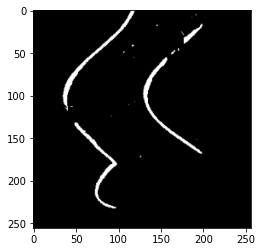

In [8]:
plt.imshow(laneData[10])


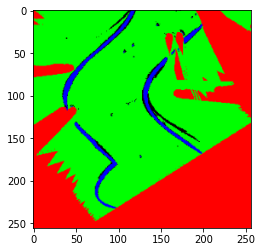

In [9]:
plt.imshow(imgData[10])

## Augmenting the Data

In [10]:
# the images are rotated by a specific offset, along with the goal, as to increase the amount of unique data the model has to train on

In [11]:
def rotateImage(angle, image):
  rad = math.radians(angle)
  center = (image.shape[1] // 2, image.shape[0] // 2)  # Center of the image

  # Get the rotation matrix
  rotationMatrix = cv2.getRotationMatrix2D(center, angle, 1.0)

  # Rotate the image
  rotatedImage = cv2.warpAffine(image, rotationMatrix, (image.shape[1], image.shape[0]))
  rotatedImage[np.all(rotatedImage==(0,0,0),axis=-1)] = (255,0,0)
  return rotatedImage

(256, 256, 3)

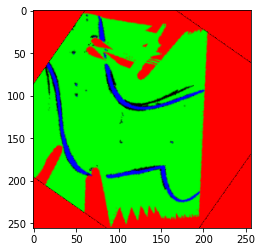

In [12]:
plt.imshow(rotateImage(55, imgData[10]))
rotateImage(55,imgData[10]).shape
#print(rotateImage(55, imgData[10]))

In [13]:
OFFSET = 45 # the angle that the image is rotated by each time

augmentedImages = []
augmentedLabels = []
augmentedLanes = []

In [14]:
for angle in range(0,360, OFFSET): #rotating the images and adding it to the array of augmented images
  print(f"getting rotated by an angle of {angle} degree")
  for image in imgData:
    rotatedImage = rotateImage(angle, image)
    augmentedImages.append(rotatedImage)
augmentedImages = np.array(augmentedImages)

min_val = np.min(augmentedImages)
max_val = np.max(augmentedImages)

augmentedImages = (augmentedImages - min_val) / (max_val - min_val) #normalizing the rgb values of the image between 0 and 1 so that model calculations are easier

getting rotated by an angle of 0 degree


getting rotated by an angle of 45 degree
getting rotated by an angle of 90 degree
getting rotated by an angle of 135 degree
getting rotated by an angle of 180 degree
getting rotated by an angle of 225 degree
getting rotated by an angle of 270 degree
getting rotated by an angle of 315 degree


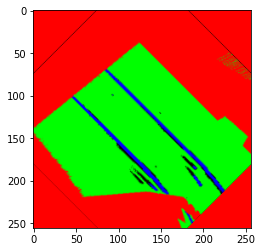

In [15]:
plt.imshow(augmentedImages[len(augmentedImages)-5])

In [16]:
for angle in range(0,360, OFFSET): #rotating the goals the same way
  rad = np.radians(angle)
  rotationMatrix = np.array([[np.cos(rad), -np.sin(rad)],
                            [np.sin(rad), np.cos(rad)]])
  labelDataOriginShifted = labelData -128
  rotatedLabels = np.dot(labelDataOriginShifted, rotationMatrix)
  rotatedLabels = rotatedLabels + 128
  rotatedLabels = np.round(rotatedLabels)
  augmentedLabels.append(rotatedLabels)

augmentedLabels = np.array(augmentedLabels)
augmentedLabels = augmentedLabels.reshape(augmentedLabels.shape[0]*augmentedLabels.shape[1],augmentedLabels.shape[2])
augmentedLabels = augmentedLabels# normalizing the coordinates between 0 and 1 so that model calculations are easier


In [17]:
for angle in range(0,360, OFFSET): #rotating the images and adding it to the array of augmented images
  print(f"getting rotated by an angle of {angle} degree")
  for image in laneData:
    rotatedImage = rotateImage(angle, image)
    augmentedLanes.append(rotatedImage)
augmentedLanes = np.array(augmentedLanes)

min_val = np.min(augmentedLanes)
max_val = np.max(augmentedLanes)

augmentedLanes = (augmentedLanes - min_val) / (max_val - min_val) #normalizing the rgb values of the image between 0 and 1 so that model calculations are easier
augmentedLanes = augmentedLanes[:,:,:,0].astype(np.float32)

getting rotated by an angle of 0 degree
getting rotated by an angle of 45 degree
getting rotated by an angle of 90 degree
getting rotated by an angle of 135 degree
getting rotated by an angle of 180 degree
getting rotated by an angle of 225 degree
getting rotated by an angle of 270 degree
getting rotated by an angle of 315 degree


In [18]:
augmentedLanes.shape

(3968, 256, 256)

## Creating the Gaussian Probability Labels

In [19]:
def gaussian(sigma, mean, x): # an equation for a 1D gaussian
    coeff = 1/ (sigma*np.sqrt(2*np.pi))
    exponent = - 0.5 * ((x-mean)/sigma)**2
    return np.exp(exponent)*coeff

def gaussian2D(sigma, mean, point): #equation for a 2d gaussian, where mean is the actual goal point, and sigma is the standard deviation for the probability distribution
    return gaussian(sigma, mean[0], point[0]) * gaussian(sigma, mean[1], point[1])

def generatePointsOnGrid(width, height): #generates the centers of each grid in the image
    points = []

    for i in range(0, width, int(np.sqrt(width))):
        for j in range(0, height, int(np.sqrt(height))):
            points.append([i+int(np.sqrt(height))/2, j+int(np.sqrt(height))/2])
    return points

def createProbablities(imgs, labels, sigma):
    _, height, width, channels = imgs.shape
    gaussianImages = []
    for i in range(len(imgs)):
        meanx,meany = labels[i][0], labels[i][1]
        x,y = np.meshgrid(np.arange(width), np.arange(height))
        x = (x - meanx)/sigma
        y = (y - meany)/sigma

        gaussianImage = (1/(sigma*sigma * 2* np.pi) )* np.exp(-0.5 * (x*x + y*y))
        lanes = imgs[i, :, :, 2]
        lanes = np.int16(lanes < 0.5)
        gaussianImage = np.minimum(gaussianImage, lanes)
        gaussianImages.append(gaussianImage)
        
    return gaussianImages

In [20]:
STANDARD_DEVIATION = 10

gaussianLabels = np.array(createProbablities(augmentedImages, augmentedLabels, STANDARD_DEVIATION))

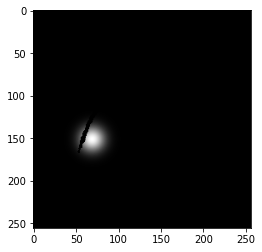

In [21]:
x = gaussianLabels[12]
plt.imshow(x, cmap="gray")

## Visualization Tools

In [22]:

def markGoals(imgs, labels):
    for i in range(len(imgs)):
        cv2.circle(imgs[i], (int(labels[i][0]), int(labels[i][1])), 10, (255,255,0), -1)

def drawGrids(imgs, gridWidth):
    print(imgs.shape)
    _, height, width, channels = imgs.shape
    for img in imgs:
        for y in range(0,height, gridWidth):
            cv2.line(img, (0,y), (width, y), (0,0,0), 1)
        for x in range(0,width, gridWidth):
            cv2.line(img, (x,0), (x,height), (0,0,0),1)    

def plotGridProbability(img, probabilities, alpha, gridWidth, trueOdds):
    height, width = img.shape[0], img.shape[1]
    
    x, y = np.ogrid[0:img.shape[0], 0:img.shape[1]]
    img = img/255
    fig = plt.figure(figsize=(15,15))

    ax = fig.add_subplot(projection='3d')

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Probalities')
    
    pointsX, pointsY = np.meshgrid(np.array(range(0, width, int(np.sqrt(height)))), range(0, height, int(np.sqrt(height)) ))
    grid = np.reshape(probabilities, (gridWidth, gridWidth))
    dx,dy = gridWidth,gridWidth
    z = grid
    norm = plt.Normalize(z.min(), z.max())
    ax.bar3d(pointsX.ravel(), pointsY.ravel(),np.zeros_like(z).ravel(), dx, dy, z.ravel(), norm = norm, alpha=alpha)

    grid = np.reshape(trueOdds, (gridWidth, gridWidth))
    dx,dy = gridWidth,gridWidth
    z = grid
    norm = plt.Normalize(z.min(), z.max())
    ax.bar3d(pointsX.ravel(), pointsY.ravel(),np.zeros_like(z).ravel(), dx, dy, z.ravel(), norm=norm, alpha=alpha/2, color='white')


    ax.plot_surface(x,y,np.atleast_2d(0), rstride=1, cstride=1, facecolors=img)
    fig.show()   

def plotProbabilities(img, label, sigma, title, alpha, trueLabel):

    x, y = np.ogrid[0:img.shape[0], 0:img.shape[1]]
    img = img/255
    fig = plt.figure(figsize=(15,15))

    ax = fig.add_subplot(projection='3d')

    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Probalities')
    pointsX, pointsY = np.meshgrid(np.arange(img.shape[0]), np.arange(img.shape[1]))
    grid = []
    
    for i in range(img.shape[0]):
        grid.append([]) 
        for j in range(img.shape[1]):
            grid[i].append(gaussian2D(sigma, label, [i,j]))
    
    cmap = plt.cm.colors.ListedColormap(['white', 'yellow'])
    z = np.array(grid)
    z = ( z - np.min(grid) ) / ( np.max(grid) - np.min(grid) )
    norm = plt.Normalize(z.min(), z.max())
    dx,dy = 1,1
    ax.bar3d(pointsX.ravel(), pointsY.ravel(),np.zeros_like(z).ravel(), dx, dy, z.ravel(),alpha=alpha/2)
    ax.plot_surface(x,y,np.atleast_2d(0), rstride=1, cstride=1, facecolors=img)


    plt.title(f"std dev: {sigma}"+title)
    fig.show()

def plotData(imgs, titles, supertitle, filePath, save):
    fig, axes = plt.subplots(1, len(imgs), figsize=(25,5))
    for i in range(len(imgs)):
        axes[i].imshow(imgs[i])
        axes[i].set_title(titles[i])
    plt.suptitle(supertitle)
    fig.set_facecolor('lightblue')
    if (save == True):
        plt.savefig(filePath)
    plt.show()

def plotAveragedGoalFromUnet(img, label, num):
    flattenedLabel = label.ravel()
    sortedLabel = np.argsort(flattenedLabel)[::-1]
    topVals = sortedLabel[:num]
    row_indices, col_indices = np.unravel_index(topVals, label.shape)
    avgX, avgY = int(np.mean(col_indices)), int(np.mean(row_indices))
    imgCpy = np.copy(img)
    imgCpy = cv2.circle(imgCpy, (avgX, avgY), 5, (30,30,80), -1)
    return imgCpy, (avgX, avgY)

## Setting Up the Data into tensor

In [23]:
class mapDataset(Dataset):

  def __init__(self, images, lanes, labels):
    self.images = images
    self.labels = labels
    self.lanes = lanes
  def __len__(self):
    return len(self.images)

  def __getitem__(self, index):
    imgSample = self.images[index]
    labelSample = self.labels[index]
    laneSample = self.lanes[index]
    return [imgSample, laneSample, labelSample]

In [24]:
dataset = mapDataset(augmentedImages, augmentedLanes, gaussianLabels)
print(augmentedImages.shape)
print(augmentedLabels.shape[0]*0.9, 0.1*augmentedLabels.shape[0])
train,test = torch.utils.data.random_split(dataset, [3571, 397])

trainDl = torch.utils.data.DataLoader(train, batch_size=4)
testDl = torch.utils.data.DataLoader(test, batch_size=4)

(3968, 256, 256, 3)
3571.2000000000003 396.8


## Unet Architecture

<img title="U-Net Architecture" alt="U-Net Architecture" src="https://miro.medium.com/v2/resize:fit:720/format:webp/1*eQLQo43suhzuHslqy-LL3g.png">

In [25]:
class UnetLanes(nn.Module):
    def __init__(self, n_class, dropoutOdds):
        super().__init__()

        #useful link to understand convolutions
        #https://makeyourownneuralnetwork.blogspot.com/2020/02/calculating-output-size-of-convolutions.html
        
        # Encoder
        # In the encoder, convolutional layers with the Conv2d function are used to extract features from the input image. 
        # Each block in the encoder consists of two convolutional layers followed by a max-pooling layer, with the exception of the last block which does not include a max-pooling layer.
        # -------
        # input: 256x256x3
        self.e11 = nn.Conv2d(3, 32, kernel_size=3, padding=1) # output: 256x256x32
        self.e12 = nn.Conv2d(32, 32, kernel_size=3, padding=1) # output: 256x256x32
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 128x128x32

        #input: 256x256x1
        self.le11 = nn.Conv2d(1,32, kernel_size=3, padding=1) #output: 256x256x32
        self.le12 = nn.Conv2d(32,32,kernel_size=3, padding=1) #output: 256x256x32
        self.lpool1 = nn.MaxPool2d(kernel_size=2, stride=2)#output:128x128x32

        # input: 128x128x32
        self.e21 = nn.Conv2d(32, 64, kernel_size=3, padding=1) # output: 128x128x64
        self.e22 = nn.Conv2d(64,64, kernel_size=3, padding=1) # output: 128x128x64
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 64x64x64

        self.le21 = nn.Conv2d(32, 64, kernel_size=3, padding=1) # output: 128x128x64
        self.le22 = nn.Conv2d(64,64, kernel_size=3, padding=1) # output: 128x128x64
        self.lpool2 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 64x64x64

        # input: 64x64x64
        self.e31 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # output: 64x64x128
        self.e32 = nn.Conv2d(128, 128, kernel_size=3, padding=1) # output: 64x64x128
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 32x32x128

        self.le31 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # output: 64x64x128
        self.le32 = nn.Conv2d(128, 128, kernel_size=3, padding=1) # output: 64x64x128
        self.lpool3 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 32x32x128


        # input: 32x32x128
        self.e41 = nn.Conv2d(128,256, kernel_size=3, padding=1) # output: 32x32x256
        self.e42 = nn.Conv2d(256,256, kernel_size=3, padding=1) # output: 32x32x256
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 16x16x256

        self.le41 = nn.Conv2d(128,256, kernel_size=3, padding=1) # output: 32x32x256
        self.le42 = nn.Conv2d(256,256, kernel_size=3, padding=1) # output: 32x32x256
        self.lpool4 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 16x16x256

        # input: 16x16x256
        self.e51 = nn.Conv2d(256,512, kernel_size=3, padding=1) # output: 16x16x512
        self.e52 = nn.Conv2d(512,512, kernel_size=3, padding=1) # output: 16x16x512

        self.le51 = nn.Conv2d(256,512, kernel_size=3, padding=1)
        self.le52 = nn.Conv2d(256, 512, kernel_size=3, padding=1)#output: 16x16x512

        # Decoder

        #input: 16x16x512
        self.upconv1 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)#output: 32x32x256
        #input: 32x32x512 (new layers have been added after concatenation from the copy and paste layer)
        self.d11 = nn.Conv2d(512,256, kernel_size=3, padding=1)#output:  32x32x256
        self.d12 = nn.Conv2d(256,256, kernel_size=3, padding=1)#output: 32x32x256

        #input: 32x32x256
        self.upconv2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)#output: 64x64x256
        #input: 64x64x256 (new layers have been added after concatenation from the copy and paste layer)
        self.d21 = nn.Conv2d(256,128, kernel_size=3, padding=1)#output: 64x64x128
        self.d22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)#output: 64x64x128

        #input: 64x64x128
        self.upconv3 = nn.ConvTranspose2d(128,64, kernel_size=2, stride=2)#output:128x128x64
        #input: 128x128x128 (new layers have been added after concatenation from the copy and paste layer)
        self.d31 = nn.Conv2d(128,64, kernel_size=3, padding=1)#output: 128x128x64
        self.d32 = nn.Conv2d(64, 64, kernel_size=3, padding=1)#output: 128x128x64

        #input: 128x128x64
        self.upconv4 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2) #output: 256x256x32
        #input: 256x256x64 (new layers have been added after concatenation from the copy and paste layer)
        self.d41 = nn.Conv2d(64, 32, kernel_size=3, padding=1)#output: 256x256x64
        self.d42 = nn.Conv2d(32,32, kernel_size=3, padding=1)#output: 256x256x32

        # Output layer
        self.outconv = nn.Conv2d(32, n_class, kernel_size=1)#output: 256x256x1
        self.dropout = nn.Dropout(dropoutOdds)

    def forward(self, x, l):
        # Encoder Image
        xe11 = relu(self.e11(x))
        xe11 = self.dropout(xe11)
        xe12 = relu(self.e12(xe11))
        xe12 = self.dropout(xe12)
        xp1 = self.pool1(xe12)
        xp1 = self.dropout(xp1)

        xe21 = relu(self.e21(xp1))
        xe21 = self.dropout(xe21)
        xe22 = relu(self.e22(xe21))
        xe22 = self.dropout(xe22)
        xp2 = self.pool2(xe22)
        xp2 = self.dropout(xp2)

        xe31 = relu(self.e31(xp2))
        xe31 = self.dropout(xe31)
        xe32 = relu(self.e32(xe31))
        xe32 = self.dropout(xe32)
        xp3 = self.pool3(xe32)
        xp3 = self.dropout(xp3)

        xe41 = relu(self.e41(xp3))
        xe41 = self.dropout(xe41)
        xe42 = relu(self.e42(xe41))
        xe42 = self.dropout(xe42)
        xp4 = self.pool4(xe42)
        xp4 = self.dropout(xp4)

        xe51 = relu(self.e51(xp4))
        xe51 = self.dropout(xe51)
        xe52 = relu(self.e52(xe51))
        xe52 = self.dropout(xe52)

        #encoder Image

        Lle11 = relu(self.le11(l))
        Lle11 = self.dropout(Lle11)
        Lle12 = relu(self.le12(Lle11))
        Lle12 = self.dropout(Lle12)
        lp1 = self.lpool1(Lle12)
        lp1 = self.dropout(lp1)

        Lle21 = relu(self.le21(lp1))
        Lle21 = self.dropout(Lle21)
        Lle22 = relu(self.le22(Lle21))
        Lle22 = self.dropout(Lle22)
        lp2 = self.lpool2(Lle22)
        lp2 = self.dropout(lp2)

        Lle31 = relu(self.le31(lp2))
        Lle31 = self.dropout(Lle31)
        Lle32 = relu(self.le32(Lle31))
        Lle32 = self.dropout(Lle32)
        lp3 = self.lpool3(Lle32)
        lp3 = self.dropout(lp3)

        Lle41 = relu(self.le41(lp3))
        Lle41 = self.dropout(Lle41)
        Lle42 = relu(self.le42(Lle41))
        Lle42 = self.dropout(Lle42)

        # Decoder
        xu1 = self.upconv1(xe52)
        xu1 = self.dropout(xu1)
        xu11 = torch.cat([xu1, Lle42], dim=1)
        xd11 = relu(self.d11(xu11))
        xd11 = self.dropout(xd11)
        xd12 = relu(self.d12(xd11))
        xd12 = self.dropout(xd12)

        xu2 = self.upconv2(xd12)
        xu2 = self.dropout(xu2)
        xu22 = torch.cat([xu2, Lle32], dim=1)
        xd21 = relu(self.d21(xu22))
        xd21 = self.dropout(xd21)
        xd22 = relu(self.d22(xd21))
        xe52 = self.dropout(xd22)

        xu3 = self.upconv3(xd22)
        xu3 = self.dropout(xu3)
        xu33 = torch.cat([xu3, Lle22], dim=1)
        xd31 = relu(self.d31(xu33))
        xd31 = self.dropout(xd31)
        xd32 = relu(self.d32(xd31))
        xd32 = self.dropout(xd32)

        xu4 = self.upconv4(xd32)
        xu4 = self.dropout(xu4)
        xu44 = torch.cat([xu4, Lle12], dim=1)
        xd41 = relu(self.d41(xu44))
        xd41 = self.dropout(xd41)
        xd42 = relu(self.d42(xd41))
        xd42 = self.dropout(xd42)
        # Output layer
        
        out = self.outconv(xd42)
        #finalOut = softmax(out)

        return out

## Creating the Model, Criterion and hyperparameters

In [26]:
ADAM_LEARNING_RATE = 0.00025
IOU_THRESHOLD = 0.0001
EPOCHS = 50

In [27]:
model = UnetLanes(n_class=1, dropoutOdds=0.2)

In [28]:
class IoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(IoULoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions 
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection 
        
        IoU = (intersection + smooth)/(union + smooth)
                
        return 1 - IoU


In [29]:
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        
        return 1 - dice



In [30]:
class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        
        intersection = (inputs * targets).sum()                            
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)  
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss
        
        return Dice_BCE



In [31]:
crossEntropy = nn.CrossEntropyLoss().to(GPU)
BCE = nn.BCELoss().to(GPU)
MSE = nn.MSELoss().to(GPU)
IoU = IoULoss().to(GPU)
DICE = DiceLoss().to(GPU)
DICEBCE = DiceBCELoss().to(GPU)
optimizer = torch.optim.Adam(model.parameters(), lr=ADAM_LEARNING_RATE)

## Training the Model

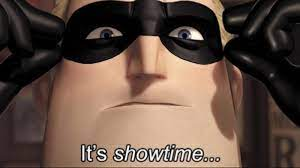

In [32]:
trainingLosses = []
testingLosses = []
model.to(GPU)
model.cuda()

UnetLanes(
  (e11): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (e12): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (le11): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (le12): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (lpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (e21): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (e22): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (le21): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (le22): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (lpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (e31): Conv2d(64, 128, kernel_size=(3, 

In [33]:
for epoch in range(EPOCHS):
    runningLoss = 0
    startTime = time.time()
    model.train()
    for i, (inputs1, inputs2, targets) in enumerate(trainDl):
        inputs1 = inputs1.view(inputs1.shape[0], inputs1.shape[3], inputs1.shape[2], inputs1.shape[1])
        inputs2 = inputs2.unsqueeze(1)
        #inputs2 = inputs2.view(inputs2.shape[0], inputs2.shape[3], inputs2.shape[2], inputs2.shape[1])
        inputs1, targets = inputs1.to(GPU), targets.to(GPU)
        inputs2 = inputs2.to(GPU)

        inputs2 = inputs2.to(torch.float32)
        inputs1 = inputs1.to(torch.float32)
        targets = targets.to(torch.float32)
        #targets = torch.where(targets>0, 1,0)
        #targets = targets.unsqueeze(0)
        
        yhat = model(inputs1, inputs2)
        yhat = yhat.squeeze(1)
        yhat = yhat.to(GPU)
        
        optimizer.zero_grad()
        
        loss = crossEntropy(yhat, targets)
        loss.backward()
        
        optimizer.step()
        runningLoss += loss.item()
        print(f"{((i+1) / len(trainDl))*100} percentage of epoch    ", end='\r')
    print("----------")
    trainingLosses.append(runningLoss / len(trainDl))
    print(f"TRAINING LOSS: {runningLoss / len(trainDl)}")


    runningLoss = 0
    with torch.no_grad():
        for i, (inputs1, inputs2, targets) in enumerate(testDl):
            inputs1 = inputs1.to(torch.float32)
            
            inputs2 = inputs2.unsqueeze(1)
            inputs2 = inputs2.to(torch.float32)
            inputs2 = inputs2.view((inputs2.shape[0], inputs2.shape[1], inputs2.shape[2], inputs2.shape[3]))


            inputs1 = inputs1.view((inputs1.shape[0], inputs1.shape[3],inputs1.shape[2],inputs1.shape[1]))
            inputs1, inputs2, targets = inputs1.to(GPU), inputs2.to(GPU), targets.to(GPU)
            outputs = model(inputs1, inputs2)
            outputs = outputs.squeeze(1)
            
            loss = crossEntropy(outputs, targets)
            runningLoss += loss.float()
            outputs = outputs.cpu()
            
            targets = targets.cpu()
    testingLosses.append(runningLoss / len(trainDl))
    # plt.plot(testingLosses, len(testingLosses), label='test')
    # plt.plot(trainingLosses, len(trainingLosses), label='train')
    endTime = time.time()
    elapsedTime = endTime-startTime

    print(f"{epoch + 1} out of {EPOCHS} epochs")
    print(f"{(elapsedTime)*(epoch+1)//60} // {(elapsedTime*EPOCHS)//60} minutes elapsed")
    # Monitor GPU memory usage
    current_memory = torch.cuda.memory_allocated() / (1024 * 1024)  # in megabytes
    print(f"GPU Memory Usage: {current_memory} MB")
    print(f"TESTING LOSS: {runningLoss/len(testDl)}")
    print("-----------")

print("completed training :)")

----------entage of epoch    of epoch      
TRAINING LOSS: 0.019687027117698416
1 out of 2 epochs
0.0 // 1.0 minutes elapsed
GPU Memory Usage: 150.94091796875 MB
TESTING LOSS: 0.019341757521033287
-----------
----------entage of epoch    of epoch      
TRAINING LOSS: 0.01889091539681625
2 out of 2 epochs
1.0 // 1.0 minutes elapsed
GPU Memory Usage: 150.06640625 MB
TESTING LOSS: 0.018715733662247658
-----------
completed training :)


In [34]:
print(testingLosses)

[tensor(0.0022, device='cuda:0'), tensor(0.0021, device='cuda:0')]


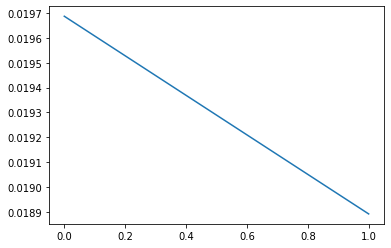

In [36]:
plt.plot(trainingLosses)
# plt.plot(testingLosses)

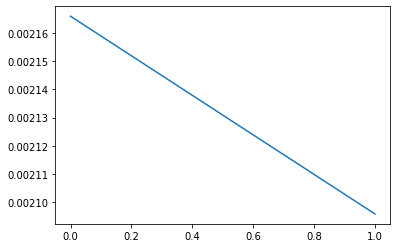

In [40]:
testingLosses = [i.cpu().float() for i in testingLosses]
plt.plot(testingLosses)

In [ ]:
model.eval()
# 4. Forward Pass and Calculate Metrics
correct = 0
total = 0
predictions = []
images = []
labels = []
tempLanes = []
with torch.no_grad():
    runningLoss = 0
    for i, (inputs1, inputs2, targets) in enumerate(testDl):
        inputs1 = inputs1.to(torch.float32)
        
        inputs2 = inputs2.unsqueeze(1)
        inputs2 = inputs2.to(torch.float32)
        inputs2 = inputs2.view((inputs2.shape[0], inputs2.shape[1], inputs2.shape[2], inputs2.shape[3]))
        
        images.append(inputs1.numpy())
        tempLanes.append(inputs2.numpy())

        inputs1 = inputs1.view((inputs1.shape[0], inputs1.shape[3],inputs1.shape[2],inputs1.shape[1]))
        inputs1, inputs2, targets = inputs1.to(GPU), inputs2.to(GPU), targets.to(GPU)
        outputs = model(inputs1, inputs2)
        outputs = outputs.squeeze(1)
        
        loss = crossEntropy(outputs, targets)
        runningLoss += loss
        outputs = outputs.cpu()
        
        predictions.append(outputs.numpy())
        targets = targets.cpu()
        labels.append(targets.numpy())
        print(f"LOSS: {runningLoss/len(testDl)}")

LOSS: 0.0001946193414916372
LOSS: 0.00035251208151308933
LOSS: 0.0005306425509575582
LOSS: 0.0006918259780672509
LOSS: 0.0008599542159692337
LOSS: 0.0010313779186927486
LOSS: 0.0011975113323774494
LOSS: 0.0014758547324665282
LOSS: 0.0016745061398038851
LOSS: 0.0018359680625271058
LOSS: 0.0020030800279797678
LOSS: 0.0021835026435745785
LOSS: 0.0024000447501922625
LOSS: 0.0026263681277689105
LOSS: 0.0027646788598733422
LOSS: 0.002944616327959791
LOSS: 0.003108281213616656
LOSS: 0.003300467844764063
LOSS: 0.0034325099281559907
LOSS: 0.0035705239399283235
LOSS: 0.003719308900281693
LOSS: 0.003923344209928314
LOSS: 0.004090749394063441
LOSS: 0.004280495479093995
LOSS: 0.004484249930578622
LOSS: 0.004666555627882964
LOSS: 0.004871512338362784
LOSS: 0.00505872987351028
LOSS: 0.005227591840848528
LOSS: 0.005395370185863624
LOSS: 0.005542008075404209
LOSS: 0.005692318968888014
LOSS: 0.005850050238674269
LOSS: 0.006010143170753996
LOSS: 0.0061872834038325985
LOSS: 0.006336475180410903
LOSS: 0.00

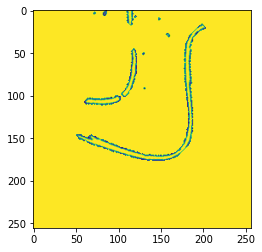

In [ ]:
plt.imshow(tempLanes[0][0][0])

In [ ]:
temp = []
for l in labels:
    for i in l:
        temp.append(i)
labels = temp

In [ ]:
temp = []
for p in predictions:
    for i in p:
        temp.append(i)

In [ ]:
predictions = (np.array(temp) - np.min(temp))/(np.max(temp)-np.min(temp))

In [ ]:
temp = []
for block in images:
    for img in block:
        temp.append(img.tolist())
images = np.array(temp)
images = images*255
images = images.astype(np.uint8)
images.shape

(397, 256, 256, 3)

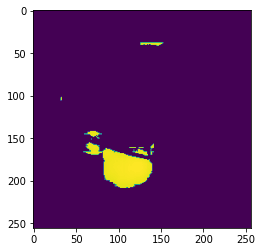

In [ ]:
def thresholdProbabilities(probability, threshold):
    temp = probability.copy()
    temp[temp<threshold] = 0
    thresholdedProbability = temp
    return thresholdedProbability

img= thresholdProbabilities(predictions[0], 0.85)
plt.imshow(img)

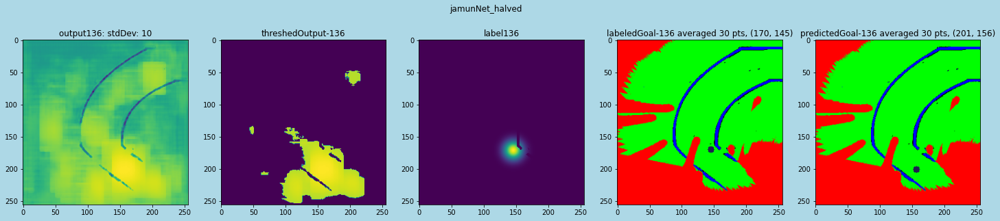

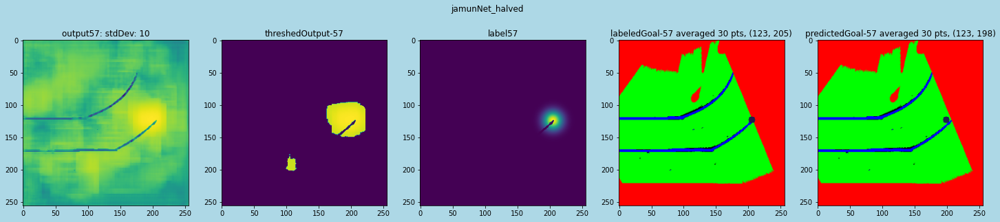

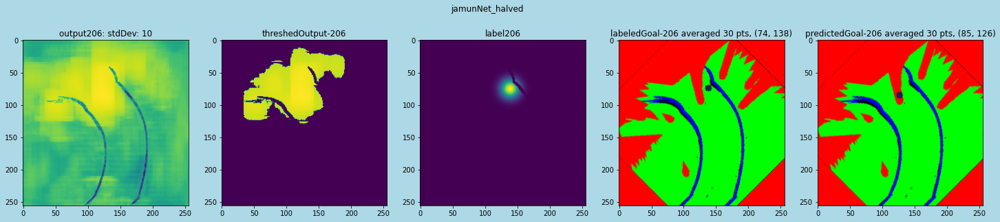

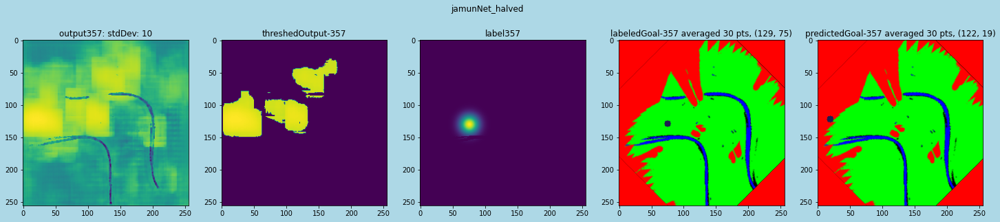

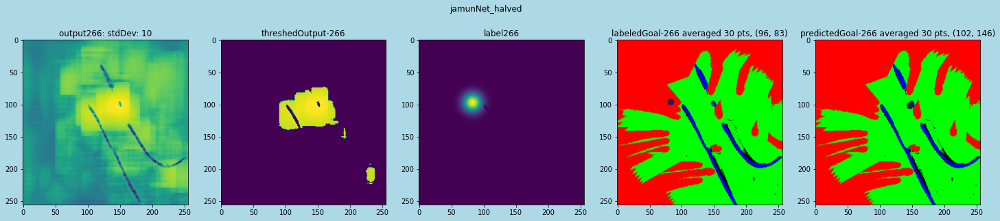

...

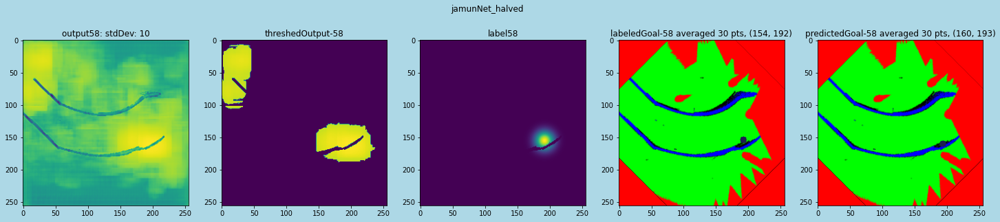

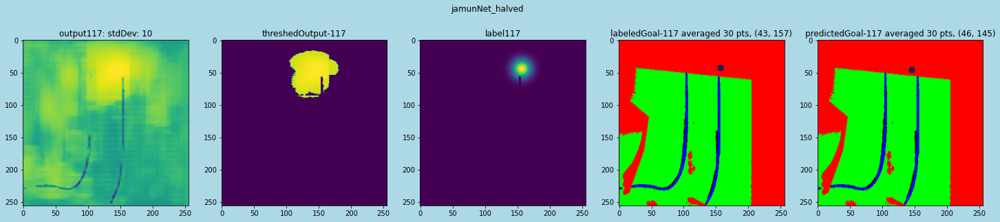

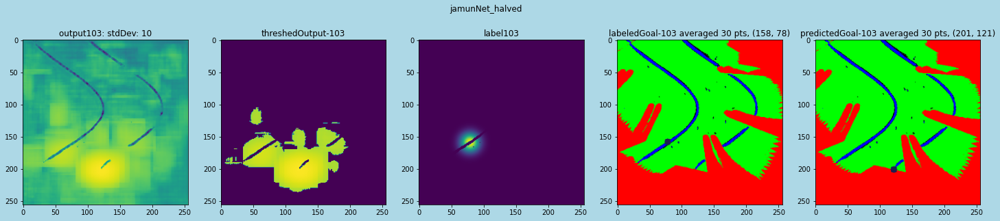

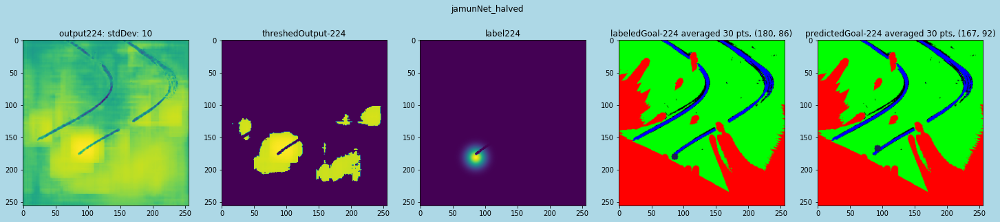

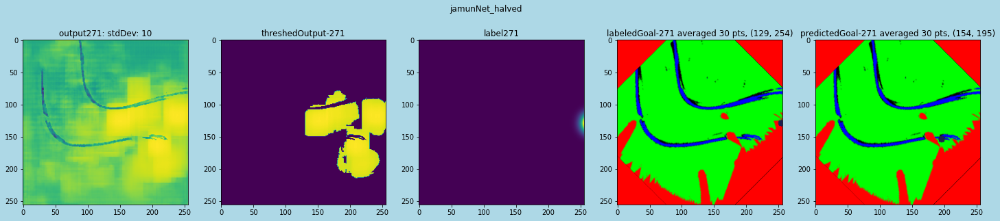

In [ ]:
for i in range(100):
    THRESHOLD = 0.85
    x = random.randint(0, len(predictions)-1)
    supertitle = "jamunNet_halved" 
    imgName = r"/home/summer_20/David/UNETPredictions/"+f"{supertitle}{x}.png"
    NUMBER_OF_POINTS = 30
    labeledGoal, (labelY, labelX) = plotAveragedGoalFromUnet(images[x], labels[x], NUMBER_OF_POINTS) 
    predictedGoal, (predictedY, predictedX) = plotAveragedGoalFromUnet(images[x], predictions[x], NUMBER_OF_POINTS)
    threshedGoal = thresholdProbabilities(predictions[x],THRESHOLD)
    plotData([predictions[x], threshedGoal, labels[x], labeledGoal, predictedGoal], [f"output{x}: stdDev: {STANDARD_DEVIATION}", f"threshedOutput-{x}", f"label{x}", f"labeledGoal-{x} averaged {NUMBER_OF_POINTS} pts, {(labelX, labelY)}", f"predictedGoal-{x} averaged {NUMBER_OF_POINTS} pts, {(predictedX, predictedY)}" ], supertitle, imgName, save=False)


In [ ]:

torch.save(model.state_dict(),"jamunNet-III.pth")